## Overview

In this project, we explore the use of Convolutional Neural Networks to classify images of pistachios into different species.
The primary goal of our project is to accurately classify pistachios into their respective species using recognition techniques.
Classifying pistachios correctly is crucial for quality control in the food industry.
Our project focuses on two main species of pistachios (Kirmizi and Sriit) using a dataset that contains over 2,000 images for our training and testing.
Using transfer learning, we were able to get an accuracy of 96.31% for our test data, with an F1 score of 61% and 46% for Kirmizi and Siirt, respectfully.


## Importing Data & Packages

In [1]:
# !pip install split-folders

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import time
import seaborn as sns
sns.set_style('darkgrid')
import shutil
import pathlib
import itertools
import cv2
import glob
import plotly.graph_objects as go
!pip install split-folders
import splitfolders
import random
import datetime

# import Deep learning Libraries
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.utils import resample
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, BatchNormalization
from tensorflow.keras import regularizers
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import TensorBoard
from keras.callbacks import EarlyStopping,ModelCheckpoint
from IPython.display import Image
!pip install visualkeras
import visualkeras
from PIL import Image

# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")

print ('modules loaded')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.7/993.7 kB 8.8 MB/s eta 0:00:00
modules loaded


### Connecting to Kaggle and Importing Pistachio Image Dataset

Loading the data from Kaggle directly into Colab seems to be a bit difficult, but a nice way to not need to download and save the data directly. [Here](https://www.analyticsvidhya.com/blog/2021/06/how-to-load-kaggle-datasets-directly-into-google-colab/) are the instructions I followed that I got the following code from.

In [3]:
# After running this cell, need to add/upload "kaggle.json" to Colab files/session
!pip install kaggle

In [4]:
! mkdir ~/.kaggle

In [5]:
! cp kaggle.json ~/.kaggle/

In [6]:
! chmod 600 ~/.kaggle/kaggle.json

In [7]:
! kaggle datasets download muratkokludataset/pistachio-image-dataset

 64% 17.0M/26.7M [00:00<00:00, 39.5MB/s]
100% 26.7M/26.7M [00:00<00:00, 56.7MB/s]


In [8]:
! unzip -qq pistachio-image-dataset.zip

### Reading in the data

In [9]:
## Setting the directory
data_dir = "Pistachio_Image_Dataset/Pistachio_Image_Dataset/"
data_dir = pathlib.Path(data_dir)

In [10]:
## Read in the data
total_images = glob.glob('Pistachio_Image_Dataset/Pistachio_Image_Dataset/*/*.jpg')
print("Total number of images: ", len(total_images))

total_images = pd.Series(total_images)

Total number of images:  2148


## Details About the Data
The [Pistachio Image Dataset](https://www.kaggle.com/datasets/muratkokludataset/pistachio-image-dataset) datset is from Kaggle and can be found [here](https://www.kaggle.com/datasets/muratkokludataset/pistachio-image-dataset).

In [11]:
total_df = pd.DataFrame()

# generate Filename field
total_df['Filename'] = total_images.map(lambda img_name: img_name.split("/")[-1])


# generate ClassId field
total_df['ClassId'] = total_images.map(lambda img_name: img_name.split("/")[-2])

# total_df.head()

In [12]:
## Total number of images for each pistachio class/type
class_id_distributionTotal = total_df['ClassId'].value_counts()
class_id_distributionTotal

Kirmizi_Pistachio    1232
Siirt_Pistachio       916
Name: ClassId, dtype: int64

ADDED BELOW

In [13]:
# ADDED

# Separate the two classes
df_kirmizi = total_df[total_df['ClassId'] == 'Kirmizi_Pistachio']
df_siirt = total_df[total_df['ClassId'] == 'Siirt_Pistachio']

# Downsample the Kirmizi_Pistachio class
df_kirmizi_downsampled = df_kirmizi.sample(n=len(df_siirt), random_state=1)

# Combine back with Siirt_Pistachio class
balanced_df = pd.concat([df_kirmizi_downsampled, df_siirt])

# Shuffle the dataset
total_df = balanced_df.sample(frac=1, random_state=1).reset_index(drop=True)

# Now 'balanced_df' is your balanced dataset


In [14]:
## Total number of images for each pistachio class/type
class_id_distributionTotal = total_df['ClassId'].value_counts()
class_id_distributionTotal

Kirmizi_Pistachio    916
Siirt_Pistachio      916
Name: ClassId, dtype: int64

ADDED ABOVE

In [15]:
fig = go.Figure(go.Bar(
            x=  class_id_distributionTotal.values,
            y=class_id_distributionTotal.index,
            orientation='h'))

fig.update_layout(title='Count of Each Pistachio Type in Image Dataset',font_size=15,title_x=0.45)


fig.show()

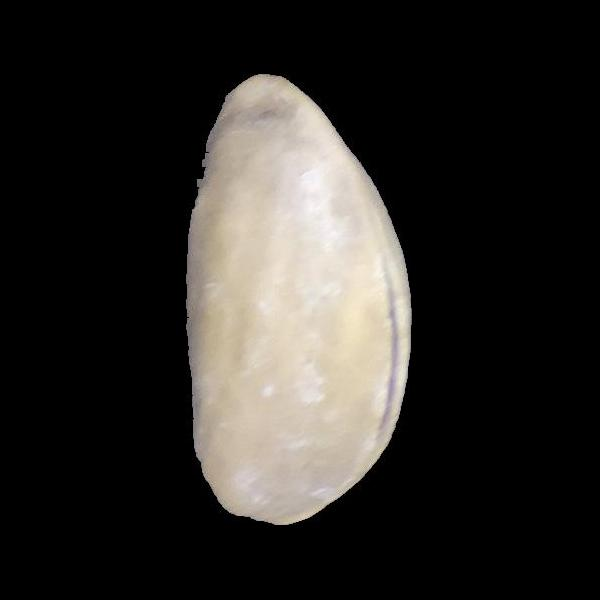

In [16]:
## Random Image from dataset
img = tf.keras.preprocessing.image.load_img(random.choice(total_images))
img

# Data Prep

## Standardizing the Data

### Breaking out data into training, validation, and testing sets

Setting the training set to 70% of the data, and the validation and test data to 15% each

In [17]:
train_pct = .7
validation_pct = .15
test_pct = .15
splitfolders.ratio(data_dir, output="output", seed=101, ratio=(train_pct, validation_pct, test_pct))

Copying files: 2148 files [00:00, 5308.96 files/s]


In [18]:
train_path='./output/train/'
val_path='./output/val'
test_path='./output/test'
class_names=os.listdir(train_path)
class_names_val=os.listdir(val_path)
class_names_test=os.listdir(test_path)

In [19]:
train_image1 = glob.glob('./output/train/*/*.jpg')
Total_TrainImages = train_image1
print("Total number of training images: ", len(Total_TrainImages))


test_image1 = glob.glob('./output/test/*/*.jpg')
Total_TestImages = test_image1
print("Total number of test images: ", len(Total_TestImages))



Val_image1 = glob.glob('./output/val/*/*.jpg')

Total_ValImages = Val_image1
print("Total number of val images: ", len(Total_ValImages))

Total number of training images:  1503
Total number of test images:  324
Total number of val images:  321


In [20]:
train_image_names = pd.Series(Total_TrainImages)
train_df = pd.DataFrame()

# generate Filename field
train_df['Filename'] = train_image_names.map(lambda img_name: img_name.split("/")[-1])


# generate ClassId field
train_df['ClassId'] = train_image_names.map(lambda img_name: img_name.split("/")[-2])

# train_df.head()

### Oversampling Example

In [21]:
# class_counts = train_df['ClassId'].value_counts()

# max_count = class_counts.max()

# oversampled_df = pd.DataFrame()
# for label in class_counts.index:
#     class_subset = train_df[train_df['ClassId'] == label]

# # Resample the class to match the max count
#     resampled_subset = resample(class_subset,
#                                 replace=True, # sample with replacement
#                                 n_samples=max_count, # match number in majority class
#                                 random_state=123) # reproducible results

# # Combine with the oversampled dataframe
#     oversampled_df = pd.concat([oversampled_df, resampled_subset])

# # Now oversampled_df is the oversampled dataset
# train_df = oversampled_df

### Undersampling Example

In [22]:
# # Count the instances per class
# class_counts = train_df['ClassId'].value_counts()

# # Find the minimum count to reduce other classes to this count
# min_count = class_counts.min()

# # Undersampling each class
# undersampled_df = pd.DataFrame()
# for label in class_counts.index:
#     # Subset for the class
#     class_subset = train_df[train_df['ClassId'] == label]

# # Resample the class to match the min count
#     resampled_subset = resample(class_subset,
#                                 replace=False, # sample without replacement
#                                 n_samples=min_count, # match number in minority class
#                                 random_state=123) # reproducible results

# # Combine with the undersampled dataframe
#     undersampled_df = pd.concat([undersampled_df, resampled_subset])

# # Now undersampled_df is the undersampled dataset
# train_df = undersampled_df

### Setting Seperate Weights for Kirmizi and Siirt

In [23]:
# ## Weighing each class porportional to the number of observations that each has in the training dataset
# kirmizi_train_count = train_df['ClassId'].value_counts()[0]
# siirt_train_count = train_df['ClassId'].value_counts()[1]

# class_weights = {0: 100/kirmizi_train_count, 1: 100/siirt_train_count}
# class_weights

In [24]:
# Number of pistachio images for each type in the training set
class_id_distribution_Train = train_df['ClassId'].value_counts()
class_id_distribution_Train

Kirmizi_Pistachio    862
Siirt_Pistachio      641
Name: ClassId, dtype: int64

In [25]:
test_image_names = pd.Series(Total_TestImages)
test_df = pd.DataFrame()

# generate Filename field
test_df['Filename'] = test_image_names.map(lambda img_name: img_name.split("/")[-1])


# generate ClassId field
test_df['ClassId'] = test_image_names.map(lambda img_name: img_name.split("/")[-2])

# test_df.head()

In [26]:
# Number of pistachio images for each type in the test set
class_id_distribution_test = test_df['ClassId'].value_counts()
class_id_distribution_test

Kirmizi_Pistachio    186
Siirt_Pistachio      138
Name: ClassId, dtype: int64

# Exploring the Data

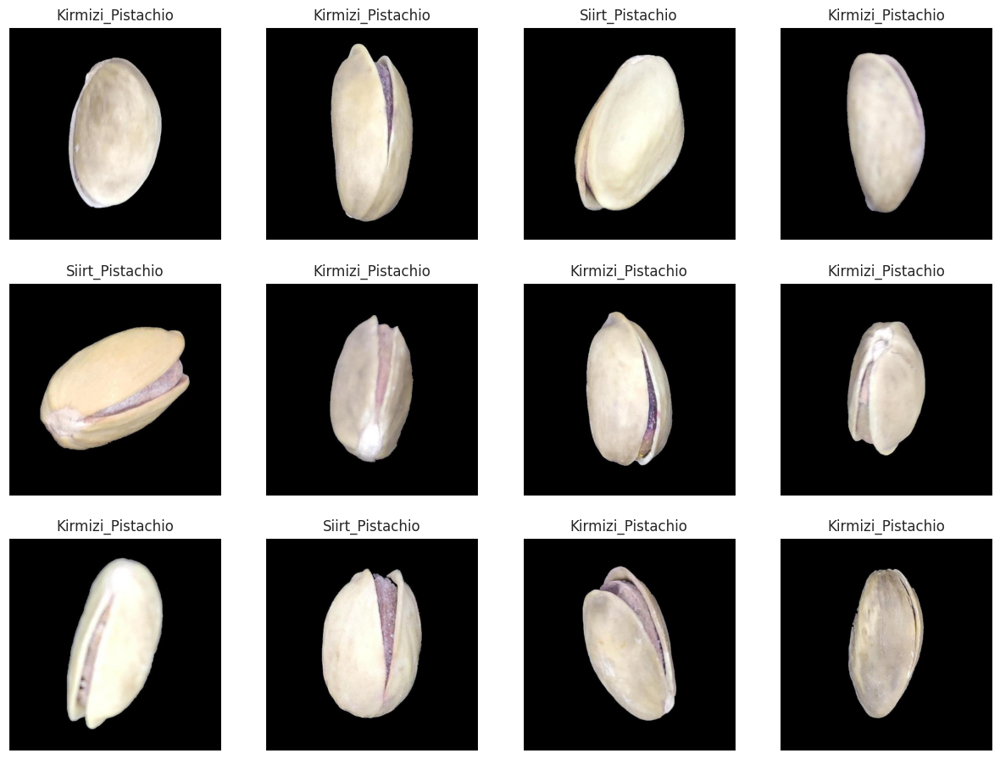

In [27]:
## Generate 12 random images from the training dataset
plot_df = train_df.sample(12).reset_index()
plt.figure(figsize=(15, 15))

for i in range(12):
    img_name = plot_df.loc[i, 'Filename']
    label_str = (plot_df.loc[i, 'ClassId'])
    plt.subplot(4,4,i+1)
    plt.imshow(plt.imread(os.path.join(train_path,label_str, img_name)))
    plt.title(label_str)
    plt.xticks([])
    plt.yticks([])
    plt.yticks([])

### Data Augmentation
The `ImageDataGenerator` class from Keras that is commonly used for real-time data augmentation and to load and preprocess images in batches.


In [28]:
## Image Data Generator
train_datagen = ImageDataGenerator(zoom_range=0.15,width_shift_range=0.2,height_shift_range=0.2,shear_range=0.15)
test_datagen = ImageDataGenerator()
val_datagen = ImageDataGenerator()
train_generator = train_datagen.flow_from_directory(train_path,target_size=(224, 224),batch_size=32,shuffle=True,class_mode='binary')
test_generator = test_datagen.flow_from_directory(test_path,target_size=(224,224),batch_size=32,shuffle=False,class_mode='binary')

val_generator = val_datagen.flow_from_directory(val_path,target_size=(224,224),batch_size=32,shuffle=False,class_mode='binary')

Found 1503 images belonging to 2 classes.
Found 324 images belonging to 2 classes.
Found 321 images belonging to 2 classes.


# Training the Model

## TensorBoard

TensorBoard allows you to save the logs or other output from your code to nicely view in an interactive UI right in your IDE. Since we want to test a few different models we can nice and easily have the training performance graphed from all the models we test in one graph to compare their performance.

In [29]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [30]:
# Clear any logs from previous runs
# !rm -rf ./logs/

In [31]:
%tensorboard --logdir logs/

Output hidden; open in https://colab.research.google.com to view.

## Transfer Learning

Since there are several well trained foundational image classification models available, we are going to start with one (specifically EfficientNetB0), and then use Transfer Learning and Fine Tuning to have the model trained for our Pistachio images.

### Loop through various models
To find the best way to do transfer learning on the EfficientNetB0 model (i.e. how many layers to freeze, layers to add, include dropout layer or not, etc.) we could test out variations of these and see how the model's training and validation accuracy and loss perform from on model to another, or we can build a for loop to automatically iterate through these combinations.

Note the following code block is the code used to loop through the various models evaluated. Commented out are the different combinations tested over the different runs, to not test everything at once, but rather find what models performed best and test other model structures that were similar to those.

In [32]:
# ## Note, you can skip this block unless you want to see the different models run.


# layer_sizes = [32, 64, 128]
# dense_layers = [0, 1, 2]
# dropouts = [0.25, 0.5]
# total_models = len(layer_sizes)*len(dense_layers)*len(dropouts)
# model_count = 0

# for dense_layer in dense_layers:
#   for layer_size in layer_sizes:
#     for dropout in dropouts:
#         NAME = "EffNetB0-{}nodes-{}dense-{}drop-{}".format(layer_size, dense_layer, dropout, int(time.time()))
#         model_count = model_count + 1
#         print("Model {} of {}:".format(model_count, total_models))
#         print(NAME)

#         tensorboard = TensorBoard(log_dir='logs/{}'.format(NAME))
#         es=EarlyStopping(monitor='val_accuracy', mode='auto', verbose=1, patience=10, restore_best_weights=True)
#         # Model for transfer learning and fine tuning
#         model = EfficientNetB0(input_shape = (224,224,3), include_top = False, weights = 'imagenet')
#         for layer in model.layers:
#           layer.trainable=False


#         x = Flatten()(model.output)
#         x = Dropout(dropout)(x)

#         for l in range(dense_layer):
#           x = Dense(layer_size)(x)
#           x = Activation('relu')(x)

#         x = Dense(1)(x)
#         x = Activation('sigmoid')(x)
#         model = keras.Model(model.input, x)
#         model.compile(loss='binary_crossentropy',
#                       optimizer='adam',
#                       weighted_metrics=['accuracy'],
#                       metrics=['accuracy'])

#         model.fit_generator(train_generator,
#                             validation_data=val_generator,
#                             epochs=30,
#                             verbose=1,
#                             class_weight=class_weights,
#                             callbacks=[es, tensorboard])

In [33]:
#model.layers

## Best Model

The best model we got from using transfer learning on the EfficientNetB0 model included a dropout layer with 25% and 1 dense layer with 128 nodes and the ReLu activation function.

So we will go ahead and run that model again:

In [34]:
layer_sizes = [128]
dense_layers = [1]
dropouts = [0.25]
total_models = len(layer_sizes)*len(dense_layers)*len(dropouts)
model_count = 0

for dense_layer in dense_layers:
  for layer_size in layer_sizes:
    for dropout in dropouts:
        NAME = "EffNetB0-{}nodes-{}dense-{}drop-{}".format(layer_size, dense_layer, dropout, int(time.time()))
        model_count = model_count + 1
        print("Model {} of {}:".format(model_count, total_models))
        print(NAME)

        tensorboard = TensorBoard(log_dir='logs/{}'.format(NAME))
        es=EarlyStopping(monitor='val_accuracy', mode='auto', verbose=1, patience=10, restore_best_weights=True)
        # Model for transfer learning and fine tuning
        model = EfficientNetB0(input_shape = (224,224,3), include_top = False, weights = 'imagenet')

        for layer in model.layers:
          layer.trainable=False


        x = Flatten()(model.output)
        x = Dropout(dropout)(x)

        for l in range(dense_layer):
          x = Dense(layer_size)(x)
          x = Activation('relu')(x)

        x = Dense(1)(x)
        x = Activation('sigmoid')(x)
        model = keras.Model(model.input, x)
        model.compile(loss='binary_crossentropy',
                      optimizer=Adam(learning_rate=0.001),
                      metrics=['accuracy'])

        model.fit_generator(train_generator,
                            validation_data=val_generator,
                            epochs=30,
                            verbose=1,
                            callbacks=[es, tensorboard])

Model 1 of 1:
EffNetB0-128nodes-1dense-0.25drop-1702435176
16705208/16705208 [==============================] - 0s 0us/step
Epoch 1/30
47/47 [==============================] - 43s 551ms/step - loss: 1.7447 - accuracy: 0.7671 - val_loss: 0.1689 - val_accuracy: 0.9377
Epoch 2/30
47/47 [==============================] - 22s 477ms/step - loss: 0.2081 - accuracy: 0.9208 - val_loss: 0.1818 - val_accuracy: 0.9502
Epoch 3/30
47/47 [==============================] - 23s 492ms/step - loss: 0.1598 - accuracy: 0.9348 - val_loss: 0.1637 - val_accuracy: 0.9377
Epoch 4/30
47/47 [==============================] - 24s 499ms/step - loss: 0.1202 - accuracy: 0.9568 - val_loss: 0.0745 - val_accuracy: 0.9688
Epoch 5/30
47/47 [==============================] - 24s 502ms/step - loss: 0.1127 - accuracy: 0.9594 - val_loss: 0.1083 - val_accuracy: 0.9720
Epoch 6/30
47/47 [==============================] - 24s 509ms/step - loss: 0.1037 - accuracy: 0.9587 - val_loss: 0.0632 - val_accuracy: 0.9782
Epoch 7/30
47/47 [

In [35]:
#Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(model.layers))

Number of layers in the base model:  244


In [36]:
## Updated Model's Structure
plot_model(model, to_file='convnet.png', show_shapes=True,show_layer_names=True)

Output hidden; open in https://colab.research.google.com to view.

## Fine-Tuning Model


Now we can take our best model from above and do some fine-tuning. We tested unfreezing all but the last 5, 10, and 15 layers (all with a `learning_rate` of 0.00001) to see which would result in the best accuracy.

The frozen number of layers that gave the best fine-tuning results was with only keeping the last 15 layers frozen.

In [ ]:
# ## Fine tuning to improve accuracy. Testing to see how many layers back I should unfreeze to get the best validation accuracy

# frozen_layers = [5, 10, 15]
# model_count = 0
# for frozen_layer in frozen_layers:
#   NAME = "fine-tuning-{}frozen-{}".format(frozen_layer, int(time.time()))
#   model_count = model_count + 1
#   print("Model {} of {}:".format(model_count, total_models))
#   print(NAME)

#   tensorboard = TensorBoard(log_dir='logs/{}'.format(NAME))
#   es=EarlyStopping(monitor='val_accuracy', mode='auto', verbose=1, patience=5, restore_best_weights=True)


#   # Freeze all the layers except for the layers in 'frozen_layers'
#   model.trainable = False
#   for layer in model.layers[-frozen_layers:]:
#       layer.trainable = True



#   # Compile the model
#   model.compile(loss='binary_crossentropy',
#                 optimizer=Adam(learning_rate=0.00001),
#                 metrics=['accuracy'])
#   # Train the model with fine-tuning
#   model.fit_generator(train_generator,validation_data=val_generator,epochs=20,verbose=1,callbacks=[es, tensorboard])

In [38]:
## Fine tuning to improve accuracy

frozen_layers = [15]
NAME = "final-model-{}".format(int(time.time()))
print(NAME)

tensorboard = TensorBoard(log_dir='logs/{}'.format(NAME))
es=EarlyStopping(monitor='val_accuracy', mode='auto', verbose=1, patience=5, restore_best_weights=True)

# Freeze all the layers except for the last 15 layers
model.trainable = False
for layer in model.layers[-15:]:
    layer.trainable = True

# Compile the model
model.compile(loss='binary_crossentropy',
              optimizer=Adam(learning_rate=0.00001),
              metrics=['accuracy'])

# Train the model with fine-tuning
model.fit_generator(train_generator,
                    validation_data=val_generator,
                    epochs=20,
                    verbose=1,
                    callbacks=[es, tensorboard])

final-model-1702436207
Epoch 1/20
47/47 [==============================] - 34s 537ms/step - loss: 0.3647 - accuracy: 0.9375 - val_loss: 0.1006 - val_accuracy: 0.9657
Epoch 2/20
47/47 [==============================] - 23s 493ms/step - loss: 0.3881 - accuracy: 0.9408 - val_loss: 0.1149 - val_accuracy: 0.9595
Epoch 3/20
47/47 [==============================] - 28s 603ms/step - loss: 0.4030 - accuracy: 0.9381 - val_loss: 0.1246 - val_accuracy: 0.9564
Epoch 4/20
47/47 [==============================] - 25s 538ms/step - loss: 0.4835 - accuracy: 0.9341 - val_loss: 0.1303 - val_accuracy: 0.9564
Epoch 5/20
47/47 [==============================] - 26s 552ms/step - loss: 0.4090 - accuracy: 0.9308 - val_loss: 0.1345 - val_accuracy: 0.9533
Epoch 6/20
47/47 [==============================] - 24s 504ms/step - loss: 0.5211 - accuracy: 0.9368 - val_loss: 0.1386 - val_accuracy: 0.9533
Epoch 6: early stopping


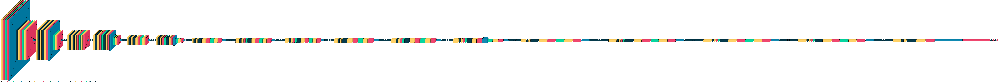

In [39]:
## Visual of the layers for the Pistachio model
visualkeras.layered_view(model, legend=True)

# Measuring Initial Model's Performance & Accuracy

In [40]:
## Calculating the loss and accuracy for our final on the test data
test_loss, test_acc = model.evaluate(test_generator, steps=len(test_generator), verbose=1)
print('Loss: %.3f' % (test_loss * 100.0))
print('Accuracy: %.3f' % (test_acc * 100.0))

11/11 [==============================] - 2s 140ms/step - loss: 0.0565 - accuracy: 0.9846
Loss: 5.652
Accuracy: 98.457


## Classification Report

In [42]:
## Generating a Classification Report to show where the final model did best and where it made the misclassifications
y_val = test_generator.classes
y_pred = model.predict(test_generator)
y_pred = np.argmax(y_pred,axis=1)

11/11 [==============================] - 4s 121ms/step


In [43]:
print(classification_report(y_val,y_pred))

              precision    recall  f1-score   support

           0       0.57      1.00      0.73       186
           1       0.00      0.00      0.00       138

    accuracy                           0.57       324
   macro avg       0.29      0.50      0.36       324
weighted avg       0.33      0.57      0.42       324



In [44]:
class_indices = test_generator.class_indices
indices = {v:k for k,v in class_indices.items()}

In [45]:
filenames = test_generator.filenames

In [46]:
val_df = pd.DataFrame()
val_df['filename'] = filenames
val_df['actual'] = y_val
val_df['predicted'] = y_pred
val_df['actual'] = val_df['actual'].apply(lambda x: indices[x])
val_df['predicted'] = val_df['predicted'].apply(lambda x: indices[x])
val_df.loc[val_df['actual']==val_df['predicted'],'Same'] = True
val_df.loc[val_df['actual']!=val_df['predicted'],'Same'] = False
val_df.head(10)

,filename,actual,predicted,Same
0,Kirmizi_Pistachio/kirmizi (20).jpg,Kirmizi_Pistachio,Kirmizi_Pistachio,True
1,Kirmizi_Pistachio/kirmizi (21).jpg,Kirmizi_Pistachio,Kirmizi_Pistachio,True
2,Kirmizi_Pistachio/kirmizi (27).jpg,Kirmizi_Pistachio,Kirmizi_Pistachio,True
3,Kirmizi_Pistachio/kirmizi (31).jpg,Kirmizi_Pistachio,Kirmizi_Pistachio,True
4,Kirmizi_Pistachio/kirmizi (34).jpg,Kirmizi_Pistachio,Kirmizi_Pistachio,True
5,Kirmizi_Pistachio/kirmizi (35).jpg,Kirmizi_Pistachio,Kirmizi_Pistachio,True
6,Kirmizi_Pistachio/kirmizi (43).jpg,Kirmizi_Pistachio,Kirmizi_Pistachio,True
7,Kirmizi_Pistachio/kirmizi (5).jpg,Kirmizi_Pistachio,Kirmizi_Pistachio,True
8,Kirmizi_Pistachio/kirmizi (53).jpg,Kirmizi_Pistachio,Kirmizi_Pistachio,True
9,Kirmizi_Pistachio/kirmizi 1.jpg,Kirmizi_Pistachio,Kirmizi_Pistachio,True


In [47]:
val_df = val_df.sample(frac=1).reset_index(drop=True)

## Prediction Comparison

In [54]:
img_size = 224
def readImage(path):
    img = load_img(path,color_mode='rgb',target_size=(img_size,img_size))
    img = img_to_array(img)
    img = img/255.

    return img

def display_images(temp_df):
    temp_df = temp_df.reset_index(drop=True)
    plt.figure(figsize = (20 , 20))
    n = 0
    for i in range(15):
        n+=1
        plt.subplot(5 , 5, n)
        plt.subplots_adjust(hspace = 0.5 , wspace = 0.3)
        image = readImage(f"/content/Pistachio_Image_Dataset/Pistachio_Image_Dataset/{temp_df.filename[i]}")
        plt.imshow(image)
        plt.title(f'Actual: {temp_df.actual[i]} \n Predicted: {temp_df.predicted[i]}')

## Images Correctly Classified
Since our model learned to only predict Kirmizi pistachios all of these images are for Kirmizi

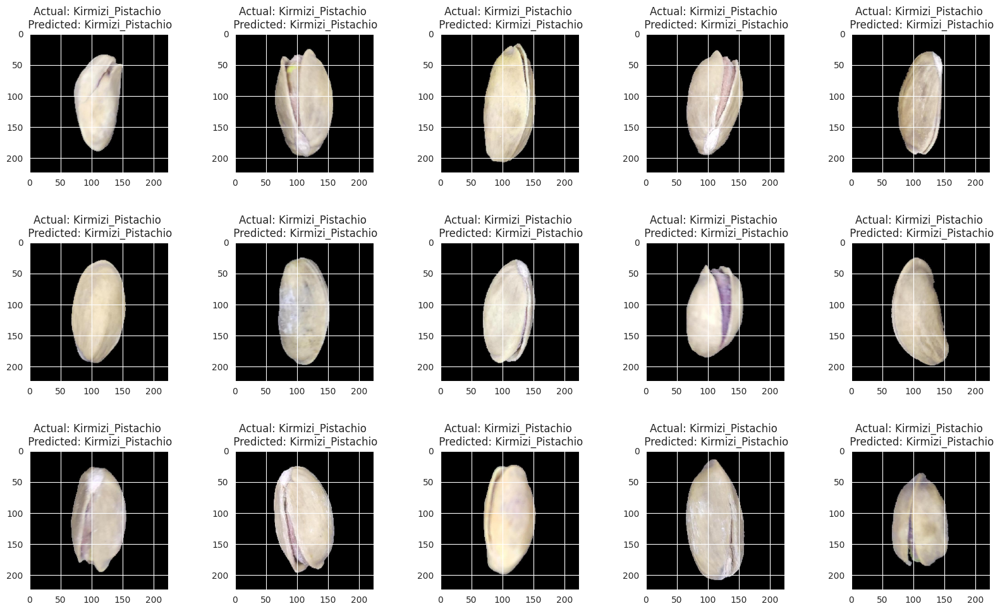

In [55]:
## Correctly classified images
display_images(val_df[val_df['Same']==True])

## Images Misclassified
Similarly, since our model learned to only predict Kirmizi pistachios all of the misclassified images are of Siirt pistachios

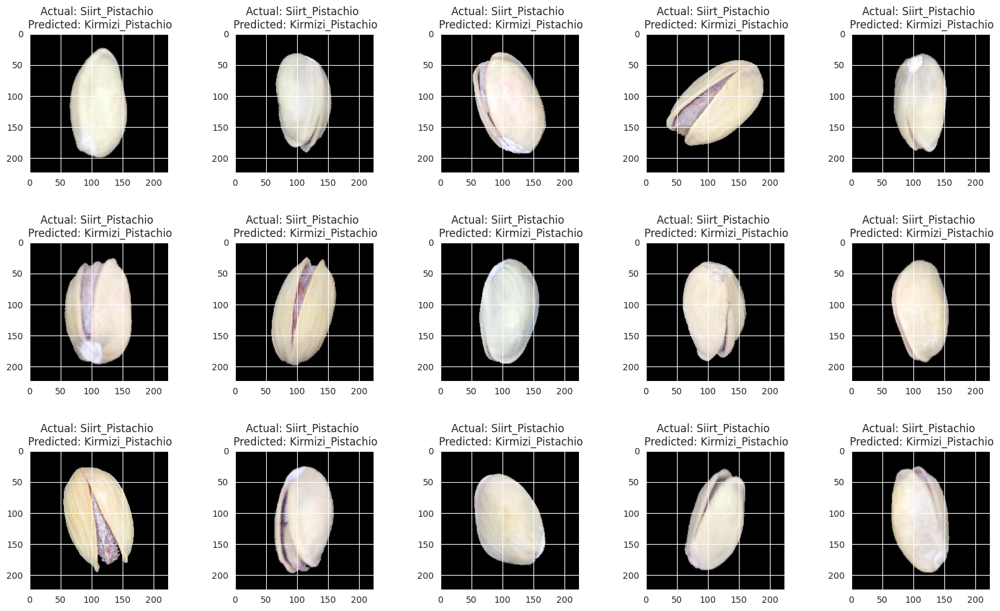

In [56]:
## A for Actual; P for Predicted
display_images(val_df[val_df['Same']!=True])

## Confusion Matrix

In [51]:
cm = confusion_matrix(y_true=y_val, y_pred=y_pred)

In [52]:
def plot_confusion_matrix(cm, classes,normalize=False,title='Confusion matrix',cmap=plt.cm.Blues):

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
        print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
        horizontalalignment="center",
        color="white" if cm[i, j] > thresh else "black")
        plt.tight_layout()
        plt.ylabel('True label')
        plt.xlabel('Predicted label')

Confusion matrix, without normalization
[[186   0]
 [138   0]]


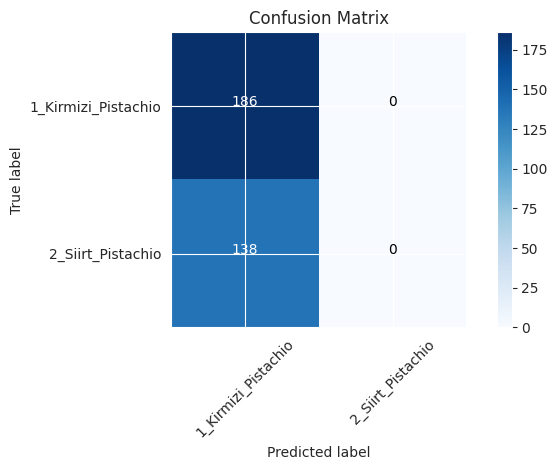

In [53]:
cm_plot_labels = ['1_Kirmizi_Pistachio', '2_Siirt_Pistachio']

plot_confusion_matrix(cm=cm, classes=cm_plot_labels, title='Confusion Matrix')

# Potential Model Improvements & Future Work

# Appendix

Nolan Testing Second Model

In [ ]:
import time
from tensorflow.keras.applications import Xception  # Using Xception as the base model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D, Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, TensorBoard

# Model configuration
layer_sizes = [256]  # Increased number of nodes
dense_layers = [2]  # Adding an additional dense layer
dropouts = [0.3]  # Increased dropout rate
total_models = len(layer_sizes) * len(dense_layers) * len(dropouts)
model_count = 0

for dense_layer in dense_layers:
    for layer_size in layer_sizes:
        for dropout in dropouts:
            NAME = "Xception-{}nodes-{}dense-{}drop-{}".format(layer_size, dense_layer, dropout, int(time.time()))
            model_count += 1
            print("Model {} of {}:".format(model_count, total_models))
            print(NAME)

            # TensorBoard and EarlyStopping
            tensorboard = TensorBoard(log_dir='logs/{}'.format(NAME))
            es = EarlyStopping(monitor='val_accuracy', mode='auto', verbose=1, patience=5, restore_best_weights=True)

            # Base model: Xception
            base_model = Xception(input_shape=(224, 224, 3), include_top=False, weights='imagenet')
            base_model.trainable = False  # Freeze the base model layers

            # Building the model
            model = Sequential()
            model.add(base_model)
            model.add(GlobalAveragePooling2D())
            model.add(Dropout(dropout))

            for _ in range(dense_layer):
                model.add(Dense(layer_size, activation='relu'))
                model.add(Dropout(dropout))

            model.add(Dense(1, activation='sigmoid'))  # Binary classification

            # Compile the model
            model.compile(loss='binary_crossentropy',
                          optimizer=Adam(learning_rate=0.0001),  # Reduced learning rate
                          metrics=['accuracy'])

            # Model training
            model.fit(train_generator,
                      validation_data=val_generator,
                      epochs=30,
                      verbose=1,
                      class_weight=class_weights,
                      callbacks=[es, tensorboard])


Model 1 of 1:
Xception-256nodes-2dense-0.3drop-1701901973
Epoch 1/30
47/47 [==============================] - 36s 531ms/step - loss: 0.5626 - accuracy: 0.5103 - val_loss: 3.0102 - val_accuracy: 0.5732
Epoch 2/30
47/47 [==============================] - 24s 501ms/step - loss: 0.3420 - accuracy: 0.5576 - val_loss: 1.0650 - val_accuracy: 0.6417
Epoch 3/30
47/47 [==============================] - 22s 473ms/step - loss: 0.2749 - accuracy: 0.5589 - val_loss: 0.5654 - val_accuracy: 0.6978
Epoch 4/30
47/47 [==============================] - 24s 519ms/step - loss: 0.2283 - accuracy: 0.5569 - val_loss: 0.5225 - val_accuracy: 0.7383
Epoch 5/30
47/47 [==============================] - 24s 510ms/step - loss: 0.2103 - accuracy: 0.5702 - val_loss: 0.6163 - val_accuracy: 0.6729
Epoch 6/30
47/47 [==============================] - 32s 676ms/step - loss: 0.1782 - accuracy: 0.5536 - val_loss: 0.5324 - val_accuracy: 0.7321
Epoch 7/30
47/47 [==============================] - 42s 882ms/step - loss: 0.1555 - 

In [ ]:
# ## Calculating the loss and accuracy for our final on the test data
# test_loss, test_acc, test_weights = model.evaluate(test_generator, steps=len(test_generator), verbose=1)
# print('Loss: %.3f' % (test_loss * 100.0))
# print('Accuracy: %.3f' % (test_acc * 100.0))

In [ ]:
## Generating a Classification Report to show where the final model did best and where it made the misclassifications
y_val = test_generator.classes
y_pred = model.predict(test_generator)
y_pred = np.argmax(y_pred,axis=1)

11/11 [==============================] - 5s 276ms/step


In [ ]:
print(classification_report(y_val,y_pred))

              precision    recall  f1-score   support

           0       0.57      1.00      0.73       186
           1       0.00      0.00      0.00       138

    accuracy                           0.57       324
   macro avg       0.29      0.50      0.36       324
weighted avg       0.33      0.57      0.42       324



In [ ]:
class_indices = test_generator.class_indices
indices = {v:k for k,v in class_indices.items()}

In [ ]:
filenames = test_generator.filenames

In [ ]:
val_df = pd.DataFrame()
val_df['filename'] = filenames
val_df['actual'] = y_val
val_df['predicted'] = y_pred
val_df['actual'] = val_df['actual'].apply(lambda x: indices[x])
val_df['predicted'] = val_df['predicted'].apply(lambda x: indices[x])
val_df.loc[val_df['actual']==val_df['predicted'],'Same'] = True
val_df.loc[val_df['actual']!=val_df['predicted'],'Same'] = False
val_df.head(10)

,filename,actual,predicted,Same
0,Kirmizi_Pistachio/kirmizi (20).jpg,Kirmizi_Pistachio,Kirmizi_Pistachio,True
1,Kirmizi_Pistachio/kirmizi (21).jpg,Kirmizi_Pistachio,Kirmizi_Pistachio,True
2,Kirmizi_Pistachio/kirmizi (27).jpg,Kirmizi_Pistachio,Kirmizi_Pistachio,True
3,Kirmizi_Pistachio/kirmizi (31).jpg,Kirmizi_Pistachio,Kirmizi_Pistachio,True
4,Kirmizi_Pistachio/kirmizi (34).jpg,Kirmizi_Pistachio,Kirmizi_Pistachio,True
5,Kirmizi_Pistachio/kirmizi (35).jpg,Kirmizi_Pistachio,Kirmizi_Pistachio,True
6,Kirmizi_Pistachio/kirmizi (43).jpg,Kirmizi_Pistachio,Kirmizi_Pistachio,True
7,Kirmizi_Pistachio/kirmizi (5).jpg,Kirmizi_Pistachio,Kirmizi_Pistachio,True
8,Kirmizi_Pistachio/kirmizi (53).jpg,Kirmizi_Pistachio,Kirmizi_Pistachio,True
9,Kirmizi_Pistachio/kirmizi 1.jpg,Kirmizi_Pistachio,Kirmizi_Pistachio,True


In [ ]:
val_df = val_df.sample(frac=1).reset_index(drop=True)

In [ ]:
# img_size = 224
# def readImage(path):
#     img = load_img(path,color_mode='rgb',target_size=(img_size,img_size))
#     img = img_to_array(img)
#     img = img/255.

#     return img

# def display_images(temp_df):
#     temp_df = temp_df.reset_index(drop=True)
#     plt.figure(figsize = (20 , 20))
#     n = 0
#     for i in range(15):
#         n+=1
#         plt.subplot(5 , 5, n)
#         plt.subplots_adjust(hspace = 0.5 , wspace = 0.3)
#         image = readImage(f"/content/Pistachio_Image_Dataset/Pistachio_Image_Dataset/{temp_df.filename[i]}")
#         plt.imshow(image)
#         plt.title(f'Actual: {temp_df.actual[i]} Predicted: {temp_df.predicted[i]}')

img_size = 224

def readImage(path):
    img = load_img(path, color_mode='rgb', target_size=(img_size, img_size))
    img = img_to_array(img)
    img = img / 255.
    return img

def display_images(temp_df):
    temp_df = temp_df.reset_index(drop=True)
    plt.figure(figsize=(20, 20))
    n = 0
    for i in range(15):
        n += 1
        plt.subplot(5, 5, n)
        # Adjusting horizontal and vertical spacing between subplots
        plt.subplots_adjust(hspace=0.6, wspace=0.4)
        image = readImage(f"/content/Pistachio_Image_Dataset/Pistachio_Image_Dataset/{temp_df.filename[i]}")
        plt.imshow(image)
        plt.title(f'Actual: {temp_df.actual[i]} \nPredicted: {temp_df.predicted[i]}')
        plt.axis('off')  # Optional: turn off the axis

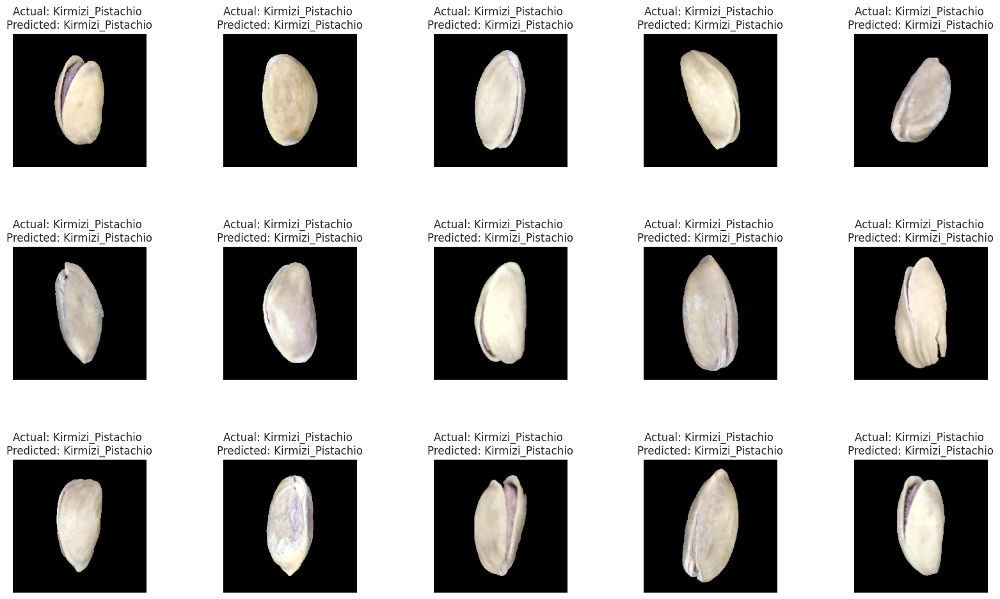

In [ ]:
## A for Actual; P for Predicted
display_images(val_df[val_df['Same']==True])

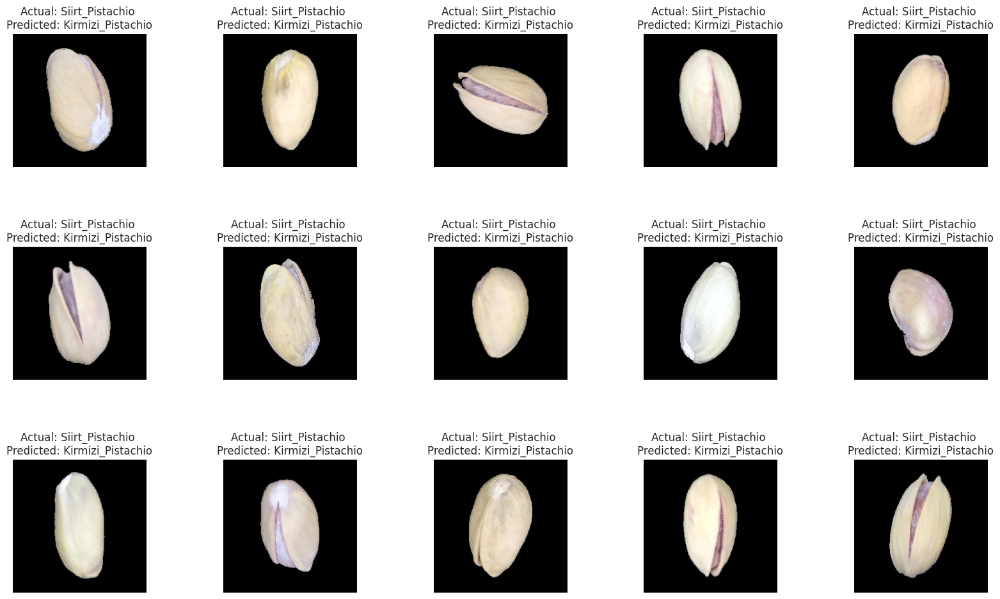

In [ ]:
## A for Actual; P for Predicted
display_images(val_df[val_df['Same']!=True])

In [ ]:
cm = confusion_matrix(y_true=y_val, y_pred=y_pred)

Confusion matrix, without normalization
[[186   0]
 [138   0]]


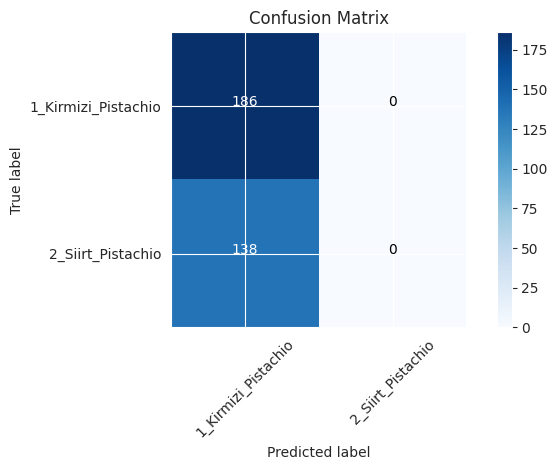

In [ ]:
cm_plot_labels = ['1_Kirmizi_Pistachio', '2_Siirt_Pistachio']

plot_confusion_matrix(cm=cm, classes=cm_plot_labels, title='Confusion Matrix')